### We're working with a file with more than 1 700 000 lines, let's obtain just the data we want, we keep a flight if: 
- The segment number is 1, so it's the first segment of a flight. 
- The first point of the segment is the airport of departure, as a check.
- The departure and arrival airports are different, so we don't have self-links

In [123]:
file = open("/home/pher/Documents/chiavetta_micc/zip/20170901_m1.so6") # we open the file to read every line and then we close it
data = file.readlines()
file.close()

In [124]:
datalist = [0]*len(data) # we create an empty list.

In [129]:
for i in range(len(data)): # we clean the data a little, and assign it to a new list, that now has a sublist of strings.
    data[i] = data[i].replace("_"," ")
    datalist[i]=data[i].split(" ")
    
del data

In [130]:
print(len(datalist)) # this is how many flights data we have in the beginning

1751823


In [131]:
print(datalist[7]) #this is a typical element now

['EDDF', '$AAAA', 'EDDF', 'EGLL', 'A20N', '105100', '105131', '4', '15', '0', 'DLH906', '170901', '170901', '3002.000000', '514.233333', '3000.983333', '514.016667', '210657801', '1', '1.026152', '0\n']


In [132]:
# Let's check how many unique airports are mentioned in our 1 750 000 rows of data
database10 = set()
for i in range(len(datalist)):
    if str(datalist[i][2]) not in database10:
        database10.add(str(datalist[i][2]))
    if str(datalist[i][3]) not in database10:
        database10.add(str(datalist[i][3]))    

In [133]:
print(len(database10)) # we have this many unique airports

1398


In [137]:
output = [] # we now apply our conditions
for i in range (len(datalist)):
    if (datalist[i][18] == "1") and (datalist[i][2] != datalist[i][3]) and (datalist[i][0] == datalist[i][2]):
        output.append(datalist[i])

In [136]:
print(len(output))
print(output[0:3]) #Output is now a list of strings.

36522
[['EDDF', '$AAAA', 'EDDF', 'EGLL', 'A20N', '105100', '105131', '4', '15', '0', 'DLH906', '170901', '170901', '3002.000000', '514.233333', '3000.983333', '514.016667', '210657801', '1', '1.026152', '0\n'], ['KEWR', '$AABN', 'KEWR', 'LFPG', 'B764', '223000', '223029', '0', '110', '0', 'UAL57', '170831', '170831', '2441.800000', '-4450.100000', '2455.883333', '-4437.833333', '210643131', '1', '16.868005', '0\n'], ['EDDM', '$AABw', 'EDDM', 'LRSB', 'CRJ9', '124800', '124829', '15', '25', '0', 'DLH5PP', '170901', '170901', '2901.233333', '707.166667', '2901.233333', '708.750000', '210662992', '1', '1.052169', '0\n']]


In [138]:
output = str(output) # let's cliean it from useless char
output = output.replace("[","")
output = output.replace("]","")
output = output.replace("'","")
output = output.replace(",","")


In [139]:
print(len(output)) # now output is just a very very long string

5116432


In [140]:
output = output.split("\\n ") # Let's split it in a list of string

In [141]:
print(len(output))
print(output[0])

36522
EDDF $AAAA EDDF EGLL A20N 105100 105131 4 15 0 DLH906 170901 170901 3002.000000 514.233333 3000.983333 514.016667 210657801 1 1.026152 0


In [142]:
file=open("output.csv","w+") # here we write output.csv as a file, just for reference
for i in range(len(output)):
    file.write(str(output[i]))
    file.write("\n")

### From here on we do a bit of Complex Networks work

In [143]:
outputl = [0] * len(output) # let's create a list, from output

for i in range (len(output)):
    outputl[i] = output[i].split(" ")

In [144]:
print(outputl[15232]) # this is what outputl contains
print(outputl[15232][2])

['ULMM', '$DsCD', 'ULMM', 'UMKK', 'B735', '182000', '182207', '3', '10', '0', 'AUL529', '170901', '170901', '4126.900000', '1965.066667', '4126.350000', '1965.100000', '210673953', '1', '0.550132', '0']
ULMM


In [145]:
register = {} # we make a register with information on the flights
indegree = {}
outdegree = {}


for i in range(len(outputl)):
    if str(str(outputl[i][2]) + "_" + str(outputl[i][3])) in register:
        register[str(str(outputl[i][2]) + "_" + str(outputl[i][3]))] += 1
    else:
        register[str(str(outputl[i][2]) + "_" + str(outputl[i][3]))] = 1
        if str(outputl[i][3]) in indegree:
            indegree[str(outputl[i][3])] += 1
        else:
            indegree[str(outputl[i][3])] = 1
        if str(outputl[i][2]) in outdegree:
            outdegree[str(outputl[i][2])] += 1
        else:
            outdegree[str(outputl[i][2])] = 1
    
        

In [153]:
print(register["EDDF_EGLL"]) # we can see how much flight departed from EDDF and arrived at EGLL

18


In [155]:
# Let's create a database for ICAO codes of flights we have considering

database1 = set()
for i in range(len(outputl)):
    if str(outputl[i][2]) not in database1:
        database1.add(str(outputl[i][2]))
    if str(outputl[i][3]) not in database1:
        database1.add(str(outputl[i][3]))

In [156]:
print("Our database contains {} airports".format(len(database1)))

Our database contains 1388 airports


### We can make a code to check how much flights are there from a departure airport to an arrival one
### Just input from keyboard the ICAO code of the two airports, when asked. Lowercase works too

In [160]:
departure = input("Please insert the ICAO code of the departure airport:")
departure = departure.upper()
if departure not in database1:
    raise NameError("The inserted airport ({}) is not in our database".format(departure))
    
arrival = input("Please insert the ICAO code of the arrival airport:")
arrival = arrival.upper()
if arrival not in database1:
    raise NameError("The inserted airport ({}) is not in our database".format(arrival))

if str(str(departure) + "_" + str(arrival)) in register:
    print("From airport " + str(departure) + " to airport " + str(arrival) + " there are " + str(register[str(str(departure) + "_" + str(arrival))]) + " flights a day.")
else:
    print("From airport " + str(departure) + " to airport " + str(arrival) + " there are no flights.")

Please insert the ICAO code of the departure airport: EDDF
Please insert the ICAO code of the arrival airport: EGLL


From airport EDDF to airport EGLL there are 18 flights a day.


### Let's write a code to calculate instrenght and outstrenght of the airports

In [20]:
instrenght = {}
outstrenght = {}

for i in range(len(outputl)):
    if str(outputl[i][3]) in instrenght:
        instrenght[str(outputl[i][3])] += 1
    else:
        instrenght[str(outputl[i][3])] = 1
    
    if str(outputl[i][2]) in outstrenght:
        outstrenght[str(outputl[i][2])] += 1
    else:
        outstrenght[str(outputl[i][2])] = 1

### This code is pretty similar to the last one, you input a ICAO code and the program tells you information about the flight degrees

In [30]:
airport = input("Please insert the ICAO code of the departure airport:")
airport = airport.upper()
if airport not in database1:
    raise NameError("The inserted airport ({}) is not in our database".format(airport))
    
v1 = indegree[str(airport)]
v2 = instrenght[str(airport)]
v3 = outdegree[str(airport)]
v4 = outstrenght[str(airport)]
v0 = str(airport)

if str(airport) in database1:
    print("The selected airport ({}) has: in-degree: {} with strenght: {} and out-degree: {} with strenght: {}".format(v0,v1,v2,v3,v4))


Please insert the ICAO code of the departure airport: EDTD


The selected airport (EDTD) has: in-degree: 2 with strenght: 2 and out-degree: 2 with strenght: 2


### I added a few lines of code to check the top 10 airports for degree, strenght ecc.

In [165]:
top = sorted(indegree.items(), key=lambda x: -x[1]) #top airports indegree
print(top[0:10])

[('LTBA', 241), ('EHAM', 237), ('LFPG', 232), ('EDDF', 219), ('EDDM', 188), ('LEMD', 171), ('LEBL', 167), ('EGSS', 167), ('EGLL', 161), ('LIRF', 160)]


In [169]:
top = sorted(instrenght.items(), key=lambda x: -x[1]) #top airports instrenght
print(top[0:10])

[('EHAM', 806), ('LFPG', 768), ('EDDF', 744), ('LTBA', 724), ('EGLL', 710), ('EDDM', 624), ('LEMD', 592), ('LEBL', 547), ('LIRF', 522), ('EGKK', 502)]


In [170]:
top = sorted(outdegree.items(), key=lambda x: -x[1]) #top airports outdegree
print(top[0:10])

[('LTBA', 245), ('EHAM', 244), ('LFPG', 237), ('EDDF', 218), ('EDDM', 188), ('LEMD', 178), ('LEBL', 167), ('EGLL', 164), ('LOWW', 158), ('EGSS', 158)]


In [171]:
top = sorted(outstrenght.items(), key=lambda x: -x[1]) #top airports outstrenght
print(top[0:10])

[('EHAM', 813), ('LFPG', 800), ('EGLL', 745), ('EDDF', 736), ('LTBA', 732), ('LEMD', 619), ('EDDM', 618), ('LEBL', 543), ('EGKK', 487), ('LIRF', 486)]


In [172]:
import igraph as ig
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [173]:
nnodes = len(database1)

In [174]:
string1 = str(database1)

In [175]:
string1 = string1.replace("'","")
string1 = string1.replace("{","")
string1 = string1.replace("}","")
string1 = string1.replace(",","")

In [176]:
list1 = string1.split(" ")

In [177]:
list1.sort()

In [178]:
print(list1) # this should be the list of the ICAO codes of our airports, alphabetically ordered

['BGMV', 'BGSF', 'BIKF', 'BIRK', 'BKPR', 'CYBG', 'CYEG', 'CYHZ', 'CYJT', 'CYOW', 'CYPQ', 'CYQX', 'CYTR', 'CYUL', 'CYVR', 'CYYC', 'CYYR', 'CYYT', 'CYYZ', 'DAAE', 'DAAG', 'DAAQ', 'DAAS', 'DAAV', 'DABB', 'DABC', 'DAOF', 'DAON', 'DAOO', 'DAUA', 'DAUG', 'DAUH', 'DAUZ', 'DBBB', 'DFFD', 'DGAA', 'DIAP', 'DNAA', 'DNMM', 'DNPO', 'DRRN', 'DTMB', 'DTNH', 'DTTA', 'DTTJ', 'DXXX', 'EBAW', 'EBBE', 'EBBR', 'EBCI', 'EBCV', 'EBKH', 'EBKT', 'EBLG', 'EBMB', 'EBOS', 'EDAC', 'EDAD', 'EDAH', 'EDAQ', 'EDAV', 'EDAY', 'EDAZ', 'EDBK', 'EDBM', 'EDBN', 'EDCG', 'EDDB', 'EDDC', 'EDDE', 'EDDF', 'EDDG', 'EDDH', 'EDDK', 'EDDL', 'EDDM', 'EDDN', 'EDDP', 'EDDR', 'EDDS', 'EDDT', 'EDDV', 'EDDW', 'EDEN', 'EDFB', 'EDFC', 'EDFE', 'EDFH', 'EDFL', 'EDFM', 'EDFQ', 'EDFR', 'EDFU', 'EDFV', 'EDFZ', 'EDGE', 'EDGS', 'EDHA', 'EDHE', 'EDHI', 'EDHK', 'EDHL', 'EDHX', 'EDJA', 'EDKB', 'EDLA', 'EDLB', 'EDLD', 'EDLE', 'EDLI', 'EDLM', 'EDLN', 'EDLP', 'EDLS', 'EDLT', 'EDLV', 'EDLW', 'EDMA', 'EDMB', 'EDML', 'EDMO', 'EDMS', 'EDMV', 'EDMY', 'EDNY',

In [180]:
index1 = {}  # this is just a index dictionary, used to know when a certain ICAO code is in the ordered list.

for i in range(len(list1)):
    index1[list1[i]] = i

In [182]:
edges = [] # here i populate the edges list with the couples of connections
for i in range(len(outputl)):
    
    if (index1[str(outputl[i][2])],index1[str(outputl[i][3])]) not in edges and (index1[str(outputl[i][2])],index1[str(outputl[i][3])]) not in edges:
        edges.append((index1[str(outputl[i][2])],index1[str(outputl[i][3])]))
    

In [190]:
print(index1[list1[250]])

250


In [191]:
totald = {} # this is a code to calculate the total degree

for i in range(len(list1)):
    if outdegree.get(list1[i], -1) != (-1) and indegree.get(list1[i], -1) != (-1) :
        totald[list1[i]] = indegree[list1[i]] + outdegree[list1[i]]
    elif outdegree.get(list1[i], -1) != (-1):
        totald[list1[i]] = outdegree[list1[i]]
    elif indegree.get(list1[i], -1) != (-1):
        totald[list1[i]] = indegree[list1[i]]
    # print(outdegree[list1[i]])

In [195]:
top = sorted(totald.items(), key=lambda x: -x[1]) # top 10 airports total degree
print(top[0:10])

[('LTBA', 486), ('EHAM', 481), ('LFPG', 469), ('EDDF', 437), ('EDDM', 376), ('LEMD', 349), ('LEBL', 334), ('EGLL', 325), ('EGSS', 325), ('EGKK', 313)]


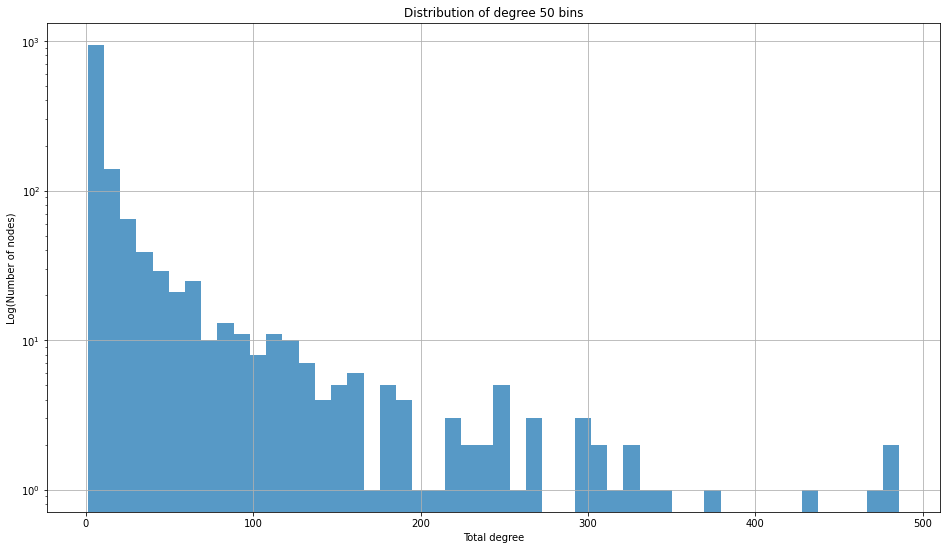

In [197]:
# Here I'll try to make a graph of the degree distribution
# We want the degree on the x, and the number of nodes with that degree on the y
# Or the histogram of the degree, we need x as the vector of the degree

x = list(totald.values())
bins = 50

plt.figure(figsize=(16,9)) #must come BEFORE the actual plot
plt.hist(x, bins, alpha=0.75, density=False) #Alpha is the opacity, density is the normalization
plt.grid(True)
plt.locator_params(nbins=20) # this is about the density of thicks on both axis I could add <, axis='x'> inside the parentesis, to do just for one axis
plt.xlabel('Total degree')
plt.ylabel('Log(Number of nodes)')
plt.title('Distribution of degree ' + str(bins) + " bins")
plt.yscale('log')
plt.xscale('linear')
plt.savefig('degree_distribution_' + str(bins) + "bins" + ".png") #always save before plt.show() it should be "namefile.png" or "namefile.pdf"
plt.show()


In [198]:
x.sort()
x = np.array(x)
y = np.arange(len(x)) / float(len(x))

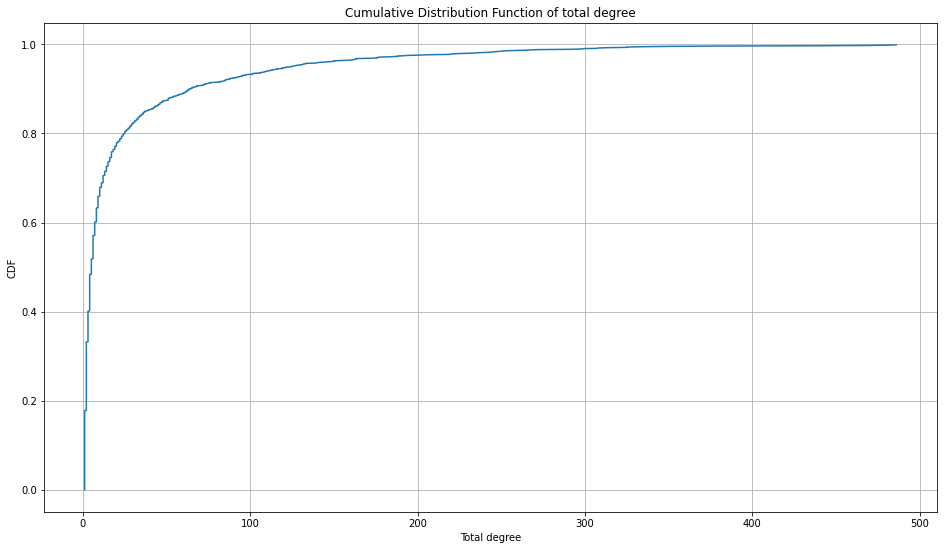

In [199]:
plt.figure(figsize=(16,9))
plt.plot(x, y) 
plt.grid(True)
plt.xlabel('Total degree')
plt.ylabel('CDF')
plt.title("Cumulative Distribution Function of total degree")
plt.yscale('linear')
plt.xscale('linear')
plt.savefig("CDF.png")
plt.show()

In [201]:
g = ig.Graph(nnodes, edges)
g["title"] = "Airports network"
g.vs["name"] = list1

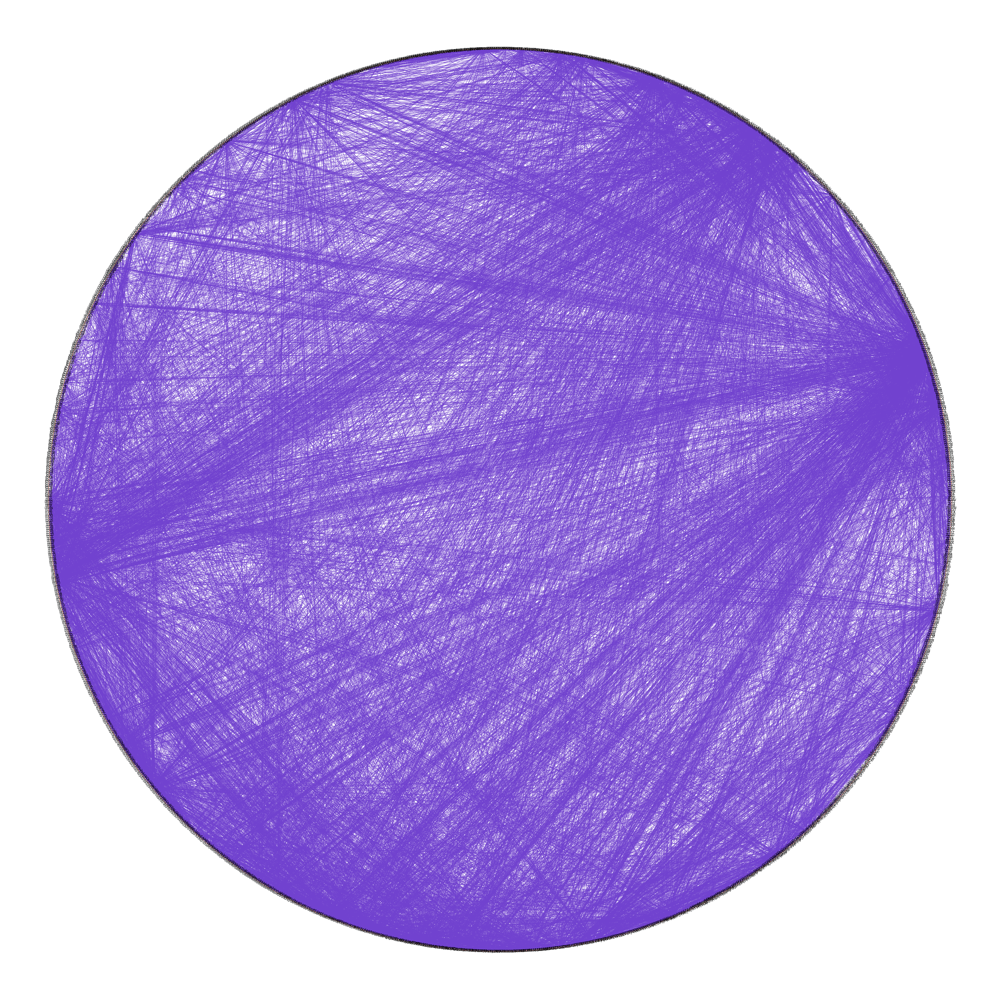

In [204]:
fig, ax = plt.subplots(figsize=(50,50)) # I don't know why, but this image sucks
ig.plot(
    g,
    target=ax,
    layout="circle", 
    vertex_size=0.003,
    vertex_color="salmon",
    vertex_frame_color="white",
    vertex_label=g.vs["name"],
    vertex_label_size=8.0,
    edge_width=0.5,
    edge_color="#7142cf"
)

plt.show()

In [205]:
fig.savefig('airports_network.png')